### I. Project Objectives

Doing analynical analysis over the scrapped data from Streeteasy.com in August 2021.

### II. Tools

1) Python: numpy, pandas, matplotlib, plotly, folium, sklearn

2) Multiple Linear Regression - for pricing prediction

### III. Codes

Scraped housing data of streeteasy.com, Greater New York area is used. 

It contains following columns and around 21,000 rows.

Attributes: 


1) GeneralType

2) RentalType

3) bath

4) bed

5) fee

6) listing

7) listing_address

8) neighborhooh

9) price

10) size


#### 3.1 Package Loading and Environment Setup

In [102]:
import numpy as np
from numpy import genfromtxt
import pandas as pd
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import datetime
import re
import os
import time
import sys
import requests
import lxml
from lxml.html.soupparser import fromstring
import numbers
import plotly.express as px
import folium
import json
import statsmodels.api as sm
from statsmodels.formula.api import ols
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn import linear_model
from sklearn.linear_model import LassoCV
from sklearn.datasets import load_boston
from mpl_toolkits.mplot3d import Axes3D

sns.set()
pd.options.mode.chained_assignment = None  # default='warn'
import warnings
warnings.filterwarnings('ignore')
pd.set_option('float_format', lambda x: '%.2f' % x)

In [103]:
#to check model/package versions
for model in np,pd,mpl,sns:
    print(model.__name__, model.__version__)

numpy 1.15.4
pandas 1.1.1
matplotlib 2.2.2
seaborn 0.8.1


In [104]:
plt.style.use('bmh') #set up plot style
%matplotlib inline 
#to skip the plt.show()
plt.rcParams['font.sans-serif'] = 'Microsoft YaHei'
plt.rcParams['axes.unicode_minus'] = False

Neighborhood Tabulation Areas (NTA)

#### 3.2 Data Loading and pre-processing

##### 3.2.1 df is the dataframe to be cleaned up and pre-processed. 

In [105]:
#to read the scrapy file that is scraped from streeteasy website
df = pd.read_csv( "streeteasy_final.csv")
df = pd.DataFrame(df)
df.head()

,GeneralType,RentalType,bath,bed,fee,listing,listing_address,neighborhood,price,size
0,For Rental,Rental Unit,1.00,1.00,No Fee,Glenwood,"1200 Union Tnpke, New Hyde Park, NY 11040",Lenox Hill,"$3,395.00",nan
1,For Rental,House,2.00,2.00,Fee,Vue Realty Group LLC,NaN,Hoboken,"$4,400.00",1075.00
2,For Rental,Condo,1.00,1.00,Fee,Trompeter Real Estate,NaN,Historic Downtown,"$2,450.00",807.00
3,For Rental,Rental Unit,1.00,1.00,No Fee,"Rose Associates, Inc.",NaN,Turtle Bay,"$4,292.00",749.00
4,For Rental,House,2.00,3.00,Fee,"Garden State Realty Group, LLC",NaN,West Side,"$2,700.00",1424.00


In [106]:
mapping = pd.read_excel("mapping.xlsx")
mapping = pd.DataFrame(mapping)
mapping.head()

,neighborhood,Borough,MODZCTA
0,Dummy,NJ,A7001
1,Bayonne,NJ,07002
2,Cliffside Park,NJ,07010
3,Edgewater,NJ,07020
4,Fort Lee,NJ,07024


In [107]:
df = pd.merge(df,mapping,on = "neighborhood", how = "left")
df.head()

,GeneralType,RentalType,bath,bed,fee,listing,listing_address,neighborhood,price,size,Borough,MODZCTA
0,For Rental,Rental Unit,1.00,1.00,No Fee,Glenwood,"1200 Union Tnpke, New Hyde Park, NY 11040",Lenox Hill,"$3,395.00",nan,Manhattan,10021
1,For Rental,House,2.00,2.00,Fee,Vue Realty Group LLC,NaN,Hoboken,"$4,400.00",1075.00,NJ,07030
2,For Rental,Condo,1.00,1.00,Fee,Trompeter Real Estate,NaN,Historic Downtown,"$2,450.00",807.00,NJ,07302
3,For Rental,Rental Unit,1.00,1.00,No Fee,"Rose Associates, Inc.",NaN,Turtle Bay,"$4,292.00",749.00,Manhattan,10017
4,For Rental,House,2.00,3.00,Fee,"Garden State Realty Group, LLC",NaN,West Side,"$2,700.00",1424.00,NJ,07304


In [108]:
df.dropna(how="all")

,GeneralType,RentalType,bath,bed,fee,listing,listing_address,neighborhood,price,size,Borough,MODZCTA
0,For Rental,Rental Unit,1.00,1.00,No Fee,Glenwood,"1200 Union Tnpke, New Hyde Park, NY 11040",Lenox Hill,"$3,395.00",nan,Manhattan,10021
1,For Rental,House,2.00,2.00,Fee,Vue Realty Group LLC,NaN,Hoboken,"$4,400.00",1075.00,NJ,07030
2,For Rental,Condo,1.00,1.00,Fee,Trompeter Real Estate,NaN,Historic Downtown,"$2,450.00",807.00,NJ,07302
3,For Rental,Rental Unit,1.00,1.00,No Fee,"Rose Associates, Inc.",NaN,Turtle Bay,"$4,292.00",749.00,Manhattan,10017
4,For Rental,House,2.00,3.00,Fee,"Garden State Realty Group, LLC",NaN,West Side,"$2,700.00",1424.00,NJ,07304
...,...,...,...,...,...,...,...,...,...,...,...,...
35086,For Sale,Co-op,1.00,1.00,NaN,Level Group,"211 East 43rd Street, New York, NY 10017",Beekman,"$625,000.00",nan,Manhattan,10022
35087,For Sale,Condo,1.00,0.50,NaN,Corcoran,"590 Madison Avenue, New York, NY 10022",Financial District,"$688,000.00",625.00,Manhattan,10006
35088,For Sale,Condo,3.00,3.00,NaN,Douglas Elliman,"575 Madison Avenue, New York, NY 10022",Flatiron,"$4,299,000.00",3007.00,Manhattan,10010
35089,For Sale,Condo,1.50,2.00,NaN,Ideal Properties Group,"78 Seventh Avenue, Brooklyn, NY 11217",Seagate,"$549,000.00",1079.00,Brooklyn,11224


In [109]:
#to check data size
df.shape

(35091, 12)

In [110]:
#to check data type
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 35091 entries, 0 to 35090
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   GeneralType      35091 non-null  object 
 1   RentalType       35091 non-null  object 
 2   bath             34859 non-null  object 
 3   bed              34897 non-null  float64
 4   fee              16671 non-null  object 
 5   listing          35091 non-null  object 
 6   listing_address  27626 non-null  object 
 7   neighborhood     35091 non-null  object 
 8   price            35091 non-null  object 
 9   size             18796 non-null  float64
 10  Borough          35091 non-null  object 
 11  MODZCTA          35091 non-null  object 
dtypes: float64(2), object(10)
memory usage: 3.5+ MB


In [111]:
df["bath"]=df["bath"].astype("string")
df["price"]=df["price"].astype("string")

In [112]:
df=df.fillna({"bath":"1"})
df=df.fillna({"bed":"1"})
df=df.fillna({"fee":"Fee"})

In [113]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 35091 entries, 0 to 35090
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   GeneralType      35091 non-null  object 
 1   RentalType       35091 non-null  object 
 2   bath             35091 non-null  string 
 3   bed              35091 non-null  object 
 4   fee              35091 non-null  object 
 5   listing          35091 non-null  object 
 6   listing_address  27626 non-null  object 
 7   neighborhood     35091 non-null  object 
 8   price            35091 non-null  string 
 9   size             18796 non-null  float64
 10  Borough          35091 non-null  object 
 11  MODZCTA          35091 non-null  object 
dtypes: float64(1), object(9), string(2)
memory usage: 3.5+ MB


In [114]:
# to transform half bath into numeric
for i in range(0,len(df["bath"])):
    if  df["bath"][i]!=None:
        df["bath"][i]=df["bath"][i].replace('+',".5")

In [115]:
# to make sue bath and bed information are necessarily complete
df = df.dropna(subset=['bath','bed'], how='all')

In [116]:
# to reformat price as numeric
# pd.set_option('mode.chained_assignment', None)
for i in range(0,len(df["price"])):
    if  df["price"][i]!=None:
        df["price"][i]=df["price"][i].replace('$',"")
        df["price"][i]=df["price"][i].replace(',',"")

In [117]:
#to dtype all features
df["GeneralType"]=df["GeneralType"].astype("string")
df["RentalType"]=df["RentalType"].astype("string")
df["bath"]=df["bath"].astype("float")
df["bed"]=df["bed"].astype("float")
df["fee"]=df["fee"].astype("string")
df["listing"]=df["listing"].astype("string")
df["listing_address"]=df["listing_address"].astype("string")
df["neighborhood"]=df["neighborhood"].astype("string")
df["price"]=df["price"].astype("float")
df["size"]=df["size"].astype("float")
df["Borough" ] = df["Borough"].astype("string")
df["MODZCTA"] = df["MODZCTA"].astype("string")

In [118]:
# listing address does not add information to this analysis
df = df.drop(["listing_address"],axis=1)

In [119]:
#to remove outliers
df = df[df["size"]!= 30613]

In [120]:
df.head()

,GeneralType,RentalType,bath,bed,fee,listing,neighborhood,price,size,Borough,MODZCTA
0,For Rental,Rental Unit,1.00,1.00,No Fee,Glenwood,Lenox Hill,3395.00,nan,Manhattan,10021
1,For Rental,House,2.00,2.00,Fee,Vue Realty Group LLC,Hoboken,4400.00,1075.00,NJ,07030
2,For Rental,Condo,1.00,1.00,Fee,Trompeter Real Estate,Historic Downtown,2450.00,807.00,NJ,07302
3,For Rental,Rental Unit,1.00,1.00,No Fee,"Rose Associates, Inc.",Turtle Bay,4292.00,749.00,Manhattan,10017
4,For Rental,House,2.00,3.00,Fee,"Garden State Realty Group, LLC",West Side,2700.00,1424.00,NJ,07304


In [121]:
df.info()
#the data size is 35086

<class 'pandas.core.frame.DataFrame'>
Int64Index: 35086 entries, 0 to 35090
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   GeneralType   35086 non-null  string 
 1   RentalType    35086 non-null  string 
 2   bath          35086 non-null  float64
 3   bed           35086 non-null  float64
 4   fee           35086 non-null  string 
 5   listing       35086 non-null  string 
 6   neighborhood  35086 non-null  string 
 7   price         35086 non-null  float64
 8   size          18791 non-null  float64
 9   Borough       35086 non-null  string 
 10  MODZCTA       35086 non-null  string 
dtypes: float64(4), string(7)
memory usage: 3.2 MB


##### 3.2.2 Other manipulations

In [122]:
#to check data info
df.columns.tolist()
df.dtypes

GeneralType      string
RentalType       string
bath            float64
bed             float64
fee              string
listing          string
neighborhood     string
price           float64
size            float64
Borough          string
MODZCTA          string
dtype: object

In [123]:
#take a look at rental types
df["RentalType"].unique()

<StringArray>
[                'Rental Unit',                       'House',
                       'Condo',                       'Co-op',
                'Multi-family',       'New Development Condo',
                   'Apartment', 'New Development Rental Unit',
                   'Townhouse',                      'Condop',
      'New Development Condop',             'Rental Building',
                    'Building',           'Three-Family Home',
             'Two-Family Home',                  'Other type',
            'Four-Family Home',          'Mixed-Use Building',
   'New Development Apartment',       'New Development Co-op',
         'Commercial Building',                  'Vacant Lot']
Length: 22, dtype: string

In [124]:
df["neighborhood"].unique()

<StringArray>
[         'Lenox Hill',             'Hoboken',   'Historic Downtown',
          'Turtle Bay',           'West Side',            'Bushwick',
      'Brighton Beach',     'Carroll Gardens',  'Stuyvesant Heights',
        'Williamsburg',
 ...
           'Arlington',        'Locust Point',       'New Hyde Park',
 'Westchester Village',          'Grant City',             'Clifton',
         'Willowbrook',       'Oakwood Beach',          'Greenridge',
       'Staten Island']
Length: 319, dtype: string

In [125]:
# run a general correlation
df.corr()

,bath,bed,price,size
bath,1.00,0.74,0.43,0.69
bed,0.74,1.00,0.28,0.82
price,0.43,0.28,1.00,0.51
size,0.69,0.82,0.51,1.00


##### 3.2.3 Slice Data into 2 Subsets

In [126]:
#to split data into 2 subsets, rental and sale
Rental = df[df["GeneralType"]=="For Rental"]
Sale = df[df["GeneralType"]=="For Sale"]
#Rental
#Sale

In [127]:
Rental.describe()

,bath,bed,price,size
count,16666.00,16666.00,16666.00,6510.00
mean,1.28,1.73,3468.01,1010.00
std,0.64,1.03,3713.04,651.65
min,0.50,0.50,550.00,100.00
25%,1.00,1.00,2000.00,670.00
50%,1.00,2.00,2595.00,850.00
75%,1.00,2.00,3596.75,1149.75
max,31.00,9.00,100000.00,9819.00


In [128]:
Sale.describe()

,bath,bed,price,size
count,18420.00,18420.00,18420.00,12281.00
mean,2.16,2.68,1978535.53,1778.19
std,1.87,2.83,4119868.68,2010.85
min,0.50,0.50,48000.00,150.00
25%,1.00,1.00,529000.00,833.00
50%,2.00,2.00,899000.00,1245.00
75%,2.50,3.00,1825000.00,2142.00
max,84.00,141.00,169000000.00,118770.00


In [129]:
any(Rental.price.isnull())

False

In [130]:
any(Sale.price.isnull())

False

##### 3.2.4 Outliers

Rental Outliers processing

In [131]:
from scipy import stats
from scipy.stats import kstest

data = Rental.price
u = data.mean() 
std = data.std()
stats.kstest(data, 'norm', (u, std))
print('Mean：%.3f，Standard Deviation：%.3f' % (u,std))
print('------')
error = data[np.abs(data - u) > 3*std]
data_c = data[np.abs(data - u) <= 3*std]
print('Outlier: %i' % len(error))

Mean：3468.006，Standard Deviation：3713.036
------
Outlier: 266


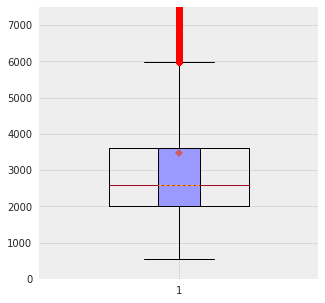

In [132]:
plt.figure(figsize=(5,5))
plt.boxplot(Rental.price,widths=0.5)
plt.boxplot(x = Rental.price, # data
            patch_artist=True, # default white
            showmeans=True, # show mean value point
            boxprops = {'color':'black','facecolor':'#9999ff'}, 
            flierprops = {'marker':'o','markerfacecolor':'red','color':'black'}, 
            meanprops = {'marker':'D','markerfacecolor':'indianred'}, 
            medianprops = {'linestyle':'--','color':'orange'}) 
plt.ylim(0,7500)
plt.tick_params(top='off', right='off')

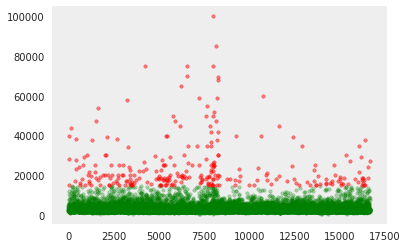

In [133]:
plt.scatter(data_c.index,data_c,color = 'g',marker='.',alpha = 0.3)
plt.scatter(error.index,error,color = 'r',marker='.',alpha = 0.5)
plt.grid()

In [134]:
data = Rental
rental= data[((data.price - data.price.mean()) / data.price.std()).abs() < 3]
rental

,GeneralType,RentalType,bath,bed,fee,listing,neighborhood,price,size,Borough,MODZCTA
0,For Rental,Rental Unit,1.00,1.00,No Fee,Glenwood,Lenox Hill,3395.00,nan,Manhattan,10021
1,For Rental,House,2.00,2.00,Fee,Vue Realty Group LLC,Hoboken,4400.00,1075.00,NJ,07030
2,For Rental,Condo,1.00,1.00,Fee,Trompeter Real Estate,Historic Downtown,2450.00,807.00,NJ,07302
3,For Rental,Rental Unit,1.00,1.00,No Fee,"Rose Associates, Inc.",Turtle Bay,4292.00,749.00,Manhattan,10017
4,For Rental,House,2.00,3.00,Fee,"Garden State Realty Group, LLC",West Side,2700.00,1424.00,NJ,07304
...,...,...,...,...,...,...,...,...,...,...,...
16666,For Rental,Rental Unit,1.00,2.00,No Fee,Compass,Yorkville,2365.00,nan,Manhattan,10028
16667,For Rental,Condo,2.50,2.00,Fee,Corcoran,Lenox Hill,8500.00,nan,Manhattan,10021
16668,For Rental,Rental Unit,2.00,2.00,No Fee,Century 21 Block & Lot Real Estate,Sunset Park,2500.00,800.00,Brooklyn,11220
16669,For Rental,Apartment,1.00,2.00,No Fee,Yaffa Realty LLC,Crown Heights,2300.00,nan,Brooklyn,11216


Sale Outliers processing

In [135]:
from scipy import stats
from scipy.stats import kstest

data = Sale.price
u = data.mean() 
std = data.std()
stats.kstest(data, 'norm', (u, std))
print('Mean：%.3f，Standard Deviation：%.3f' % (u,std))
print('------')
error = data[np.abs(data - u) > 3*std]
data_c = data[np.abs(data - u) <= 3*std]
print('Outlier: %i' % len(error))

Mean：1978535.534，Standard Deviation：4119868.675
------
Outlier: 290


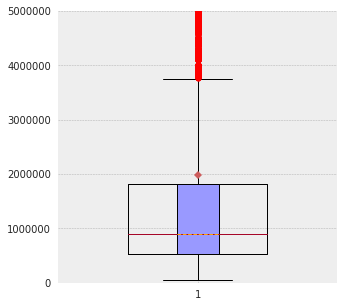

In [136]:
plt.figure(figsize=(5,5))
plt.boxplot(Sale.price,widths=0.5)
plt.boxplot(x = Sale.price, 
            patch_artist=True, 
            showmeans=True, 
            boxprops = {'color':'black','facecolor':'#9999ff'},
            flierprops = {'marker':'o','markerfacecolor':'red','color':'black'}, 
            meanprops = {'marker':'D','markerfacecolor':'indianred'}, 
            medianprops = {'linestyle':'--','color':'orange'}) 
plt.ylim(0,5000000)
plt.tick_params(top='off', right='off')

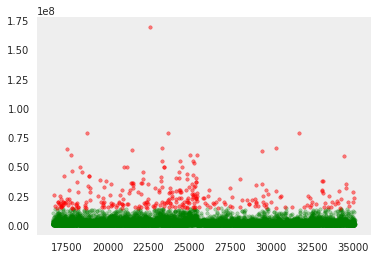

In [137]:
plt.scatter(data_c.index,data_c,color = 'g',marker='.',alpha = 0.3)
plt.scatter(error.index,error,color = 'r',marker='.',alpha = 0.5)
plt.grid()

In [138]:
data = Sale
sale = data[((data.price - data.price.mean()) / data.price.std()).abs() < 3]
sale

,GeneralType,RentalType,bath,bed,fee,listing,neighborhood,price,size,Borough,MODZCTA
16671,For Sale,New Development Condo,2.50,1.00,Fee,Alloy Advisory LLC,DUMBO,3280000.00,3068.00,Brooklyn,11201
16672,For Sale,Multi-family,4.00,5.00,Fee,Modern Spaces,Ditmars-Steinway,1800000.00,2048.00,Queens,11105
16673,For Sale,Co-op,1.00,1.00,Fee,Robert DeFalco Realty,Fort Hamilton,439000.00,1080.00,Brooklyn,11209
16674,For Sale,New Development Condo,4.50,5.00,Fee,Alchemy Properties Inc,Upper West Side,10350000.00,3133.00,Manhattan,10024
16675,For Sale,Condo,2.50,3.00,Fee,Realmart Realty,New Jersey,508000.00,1861.00,NJ,07849
...,...,...,...,...,...,...,...,...,...,...,...
35086,For Sale,Co-op,1.00,1.00,Fee,Level Group,Beekman,625000.00,nan,Manhattan,10022
35087,For Sale,Condo,1.00,0.50,Fee,Corcoran,Financial District,688000.00,625.00,Manhattan,10006
35088,For Sale,Condo,3.00,3.00,Fee,Douglas Elliman,Flatiron,4299000.00,3007.00,Manhattan,10010
35089,For Sale,Condo,1.50,2.00,Fee,Ideal Properties Group,Seagate,549000.00,1079.00,Brooklyn,11224


In [139]:
#fig = plt.figure(figsize = (10,6))
#ax1 = fig.add_subplot(2,1,1)
#data.plot(kind = 'kde',grid = True,style = '-k',title = 'density curve')
#plt.axvline(3*std,color='r',linestyle="--",alpha=0.8) 
#plt.axvline(-3*std,color='r',linestyle="--",alpha=0.8) 

In [140]:
#finish Rental dataset cleaning
Rental = rental

In [141]:
Rental.corr()

,bath,bed,price,size
bath,1.00,0.51,0.58,0.67
bed,0.51,1.00,0.32,0.68
price,0.58,0.32,1.00,0.52
size,0.67,0.68,0.52,1.00


In [142]:
# finish Sale dataset cleaning
Sale = sale

In [143]:
Sale.corr()

,bath,bed,price,size
bath,1.00,0.78,0.47,0.76
bed,0.78,1.00,0.31,0.78
price,0.47,0.31,1.00,0.56
size,0.76,0.78,0.56,1.00


#### 3.3 The 10 Neighborhood to Watch

Question1 - Top 10 Expensive Neighborhood for rental in NYC Metro Area

In [144]:
#Top 10 Expensive Neighborhood for rental (be median rent or mean rent)

nta = Rental.groupby(["neighborhood"])

def unitprice(nta):
    x1=nta['price']
    x2=nta['size']
    return x1.mean()/x2.mean()

unitpriceRental1=pd.DataFrame(nta.apply(unitprice))

nta = Rental.groupby(["neighborhood"])

def medianprice(nta):
    x1=nta['price']
    x2=nta['size']
    return x1.median()/x2.median()

unitpriceRental2=pd.DataFrame(nta.apply(medianprice))

unitpriceRental=pd.merge(unitpriceRental1,unitpriceRental2,on="neighborhood")
unitpriceRental.columns=['unitprice','medianprice']
unitpriceRental

,unitprice,medianprice
neighborhood,,
Arverne,nan,nan
Astoria,2.84,2.84
Auburndale,4.17,4.49
Bath Beach,2.21,1.92
Battery Park City,5.98,5.82
...,...,...
Woodhaven,2.09,1.94
Woodlawn,2.16,2.16
Woodside,2.40,2.53


In [145]:
unitpriceRental['count']=nta[['price','size']].agg('count').min(axis=1)
unitpriceRental['monthlyRent']=nta[['price']].agg('mean')
unitpriceRental['monthlyRent_median']=nta[['price']].agg('median')
unitpriceRental['neighborhoods']=unitpriceRental.index

In [146]:
# by mean value
Rental10 = unitpriceRental.sort_values(by = ["unitprice"],ascending = [False]).head(10)
Rental10Mean = Rental10[['unitprice']]
Rental10Mean

,unitprice
neighborhood,
Little Italy,7.07
NoMad,6.97
Central Park South,6.71
West Chelsea,6.64
Noho,6.38
Hudson Square,6.19
Hudson Yards,6.17
Downtown Brooklyn,6.12
Tribeca,6.09


In [147]:
# by median value
Rental10 = unitpriceRental.sort_values(by = ["medianprice"],ascending = [False]).head(10)
Rental10Median = Rental10[['medianprice']]
Rental10Median

,medianprice
neighborhood,
NoMad,8.08
Noho,7.48
West Village,7.04
Central Park South,6.75
Fulton/Seaport,6.72
West Chelsea,6.69
Hudson Yards,6.67
Tribeca,6.56
Chelsea,6.29


#### 3.3 The 10 Neighborhood to Watch

#Question2 - Top 10 Expensive Neighborhood for sale in NYC Metro Area

In [148]:
# To add monthly mortgage into columns
#P = principal loan amount, assuming 20% lump sum down-payment 
#i = monthly interest rate, 30 Year Fixed Conforming today is 2.875%
#n = number of months required to repay the loan, a 30-year fixed mortgage would have 360 payments (30x12=360)

P = Sale.price*0.8
i = 0.02875/12
n = 30*12

M=P*(i*(1+i)**n)/((1+i)**n-1)

M

Sale['mortgage']=M

In [149]:
#Top 10 Expensive Neighborhood for sale (be median rent or mean rent)

nta = Sale.groupby(["neighborhood"])

def unitprice(nta):
    x1=nta['price']
    x2=nta['size']
    return x1.mean()/x2.mean()

unitpriceSale1=pd.DataFrame(nta.apply(unitprice))

def medianprice(nta):
    x1=nta['price']
    x2=nta['size']
    return x1.median()/x2.median()

unitpriceSale2=pd.DataFrame(nta.apply(medianprice))
unitpriceSale=pd.merge(unitpriceSale1,unitpriceSale2,on="neighborhood")

unitpriceSale.columns=['unitprice','medianprice']

unitpriceSale

,unitprice,medianprice
neighborhood,,
Annadale,317.33,377.06
Arden Heights,282.07,309.45
Arlington,nan,nan
Arrochar,367.25,367.25
Arverne,348.05,309.08
...,...,...
Woodlawn,270.68,270.68
Woodrow,363.10,437.76
Woodside,552.29,558.82


In [152]:
unitpriceSale['count']=nta[['price','size']].agg('count').min(axis=1)
unitpriceSale['mortgage']=nta[['mortgage']].agg('mean')
unitpriceSale['mortgage_median']=nta[['mortgage']].agg('median')
unitpriceSale['neighborhoods']=unitpriceSale.index

In [153]:
Sale10 = unitpriceSale.sort_values(by = ["unitprice"],ascending = [False]).head(10)
Sale10Mean = Sale10[['unitprice']]
Sale10Mean

,unitprice
neighborhood,
Noho,2289.39
Hudson Yards,2286.55
Vinegar Hill,2198.22
West Chelsea,2187.06
Central Park South,2154.29
Soho,2026.85
Nolita,2019.15
Tribeca,2017.19
Midtown,2011.54


In [154]:
Sale10 = unitpriceSale.sort_values(by = ["medianprice"],ascending = [False]).head(10)
Sale10Median = Sale10[['medianprice']]
Sale10Median

,medianprice
neighborhood,
Nolita,2702.70
Noho,2344.15
Hudson Yards,2111.52
Tribeca,2046.35
Vinegar Hill,2037.38
Soho,1993.15
Cobble Hill,1874.64
West Chelsea,1864.41
NoMad,1800.00


#### 3.3 The 10 Neighborhood to Watch
#Question3 - Top 10 Overpriced Neighborhood in NYC Metro Area

In [155]:
unitpriceRental

,unitprice,medianprice,count,monthlyRent,monthlyRent_median,neighborhoods
neighborhood,,,,,,
Arverne,nan,nan,0,2300.00,2300.00,Arverne
Astoria,2.84,2.84,184,2335.37,2200.00,Astoria
Auburndale,4.17,4.49,1,1924.75,2072.50,Auburndale
Bath Beach,2.21,1.92,7,1916.46,1725.00,Bath Beach
Battery Park City,5.98,5.82,32,5657.13,4560.00,Battery Park City
...,...,...,...,...,...,...
Woodhaven,2.09,1.94,1,1829.60,1699.00,Woodhaven
Woodlawn,2.16,2.16,2,1997.00,1997.00,Woodlawn
Woodside,2.40,2.53,16,2085.76,1895.00,Woodside


In [156]:
unitpriceSale

,unitprice,medianprice,count,mortgage,mortgage_median,neighborhoods
neighborhood,,,,,,
Annadale,317.33,377.06,6,2945.97,2651.99,Annadale
Arden Heights,282.07,309.45,3,1380.64,1390.72,Arden Heights
Arlington,nan,nan,0,1203.19,1203.19,Arlington
Arrochar,367.25,367.25,2,4313.22,4313.22,Arrochar
Arverne,348.05,309.08,6,2712.69,2452.84,Arverne
...,...,...,...,...,...,...
Woodlawn,270.68,270.68,2,819.83,819.83,Woodlawn
Woodrow,363.10,437.76,4,3085.55,2637.88,Woodrow
Woodside,552.29,558.82,52,2489.09,1576.59,Woodside


In [157]:
# Mege tables
V1Merge=pd.merge(unitpriceRental,unitpriceSale,on="neighborhoods")
V1Merge

,unitprice_x,medianprice_x,count_x,monthlyRent,monthlyRent_median,neighborhoods,unitprice_y,medianprice_y,count_y,mortgage,mortgage_median
0,nan,nan,0,2300.00,2300.00,Arverne,348.05,309.08,6,2712.69,2452.84
1,2.84,2.84,184,2335.37,2200.00,Astoria,653.00,832.72,106,3860.35,2618.80
2,4.17,4.49,1,1924.75,2072.50,Auburndale,496.76,501.34,16,3877.84,3647.55
3,2.21,1.92,7,1916.46,1725.00,Bath Beach,563.17,744.64,46,3358.18,2651.99
4,5.98,5.82,32,5657.13,4560.00,Battery Park City,1394.50,1182.16,88,5397.71,3651.05
...,...,...,...,...,...,...,...,...,...,...,...
232,2.09,1.94,1,1829.60,1699.00,Woodhaven,341.51,407.41,13,2375.13,2482.72
233,2.16,2.16,2,1997.00,1997.00,Woodlawn,270.68,270.68,2,819.83,819.83
234,2.40,2.53,16,2085.76,1895.00,Woodside,552.29,558.82,52,2489.09,1576.59
235,2.08,1.97,2,1973.75,1875.00,Woodstock,428.99,341.29,5,1290.32,1092.00


In [158]:
V1Merge.columns=['roomrate_rental','median_roomrate_rental','availability_rental','monthly_rent','median_monthly_rent','neighborhood',
                 'roomrate_sale','median_roomrate_sale','availability_sale','monthly_mortage','median_monthly_mortage']
V2Merge = V1Merge[['neighborhood','roomrate_rental','roomrate_sale','median_roomrate_rental','median_roomrate_sale','monthly_rent','monthly_mortage','median_monthly_rent','median_monthly_mortage','availability_rental','availability_sale']]
V2Merge.sort_values(by = ["roomrate_rental","roomrate_sale"],ascending = [False,False]).head(10)

,neighborhood,roomrate_rental,roomrate_sale,median_roomrate_rental,median_roomrate_sale,monthly_rent,monthly_mortage,median_monthly_rent,median_monthly_mortage,availability_rental,availability_sale
122,Little Italy,7.07,1374.79,5.88,964.34,3183.42,11910.88,2647.50,8795.72,1,8
152,NoMad,6.97,1957.34,8.08,1800.00,6235.27,10840.89,5787.00,8961.68,36,99
32,Central Park South,6.71,2154.29,6.75,1740.06,7639.39,9747.15,7425.00,6098.92,37,49
220,West Chelsea,6.64,2187.06,6.69,1864.41,5777.89,15781.60,4555.50,12778.69,24,117
153,Noho,6.38,2289.39,7.48,2344.15,9400.00,18000.33,9900.00,15102.09,6,25
102,Hudson Square,6.19,1986.35,4.73,1680.67,6015.00,11296.97,4597.50,7965.94,2,49
103,Hudson Yards,6.17,2286.55,6.67,2111.52,4807.15,15167.85,4394.50,13259.96,39,39
52,Downtown Brooklyn,6.12,1227.71,5.55,1080.53,4356.21,4438.10,3689.00,3941.48,56,145
205,Tribeca,6.09,2017.19,6.56,2046.35,7399.18,15277.29,6500.00,13774.43,43,211
33,Chelsea,6.04,1382.54,6.29,1406.07,5142.89,8313.54,4695.50,6223.39,52,146


In [159]:
V2Merge.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 237 entries, 0 to 236
Data columns (total 11 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   neighborhood            237 non-null    object 
 1   roomrate_rental         199 non-null    float64
 2   roomrate_sale           233 non-null    float64
 3   median_roomrate_rental  199 non-null    float64
 4   median_roomrate_sale    233 non-null    float64
 5   monthly_rent            237 non-null    float64
 6   monthly_mortage         237 non-null    float64
 7   median_monthly_rent     237 non-null    float64
 8   median_monthly_mortage  237 non-null    float64
 9   availability_rental     237 non-null    int64  
 10  availability_sale       237 non-null    int64  
dtypes: float64(8), int64(2), object(1)
memory usage: 22.2+ KB


In [160]:
median_roomrate_rental = V2Merge['median_roomrate_rental']
median_roomrate_sale = V2Merge['median_roomrate_sale']
Price_to_Rent = median_roomrate_sale / (median_roomrate_rental*12)
V2Merge['Price_to_Rent'] = Price_to_Rent

In [161]:
Pricing10 = V2Merge.sort_values(by = ["Price_to_Rent"],ascending = [False]).head(10)
Pricing10 = Pricing10[["neighborhood","Price_to_Rent"]]
Pricing10

,neighborhood,Price_to_Rent
154,Nolita,52.06
214,Vinegar Hill,39.41
210,Upper Carnegie Hill,38.72
124,Long Island City,36.78
187,Soho,36.71
38,Cobble Hill,36.41
34,Chinatown,33.82
56,East Flushing,33.11
3,Bath Beach,32.38
50,Dongan Hills,32.19


#### 3.3 The 10 Neighborhood to Watch
#Question4 - Top 10 Profitable Neighborhood for sale in NYC Metro Area （Investment Property)

In [162]:
roomrate_rental = V2Merge['roomrate_rental']
roomrate_sale = V2Merge['roomrate_sale']
GrossRentalYield = roomrate_rental*12/roomrate_sale
V2Merge['GrossRentalYield'] = GrossRentalYield
Profitable10 = V2Merge.sort_values(by = ["GrossRentalYield"],ascending = [False]).head(10)
Profitable10 = Profitable10[["neighborhood","GrossRentalYield"]]
Profitable10

,neighborhood,GrossRentalYield
59,East Tremont,0.28
95,Highbridge,0.18
41,Concourse,0.13
6,Bay Terrace (Queens),0.13
185,Secaucus,0.12
118,Kingsbridge Heights,0.11
45,Crotona Park East,0.11
166,Pelham Bay,0.11
29,Castle Hill,0.10
2,Auburndale,0.10


#### 3.3 The 10 Neighborhood to Watch
#Question5 - Top 10 lowest mortgage-to-rent Neighborhood for sale in NYC Metro Area (Primary Residence）

In [163]:
monthly_mortage = V2Merge['monthly_mortage']
monthly_rent = V2Merge['monthly_rent']
mortage_to_rent = monthly_mortage/monthly_rent
V2Merge['mortage_to_rent'] = mortage_to_rent
Affordable10 = V2Merge.sort_values(by = ["mortage_to_rent"],ascending = [True]).head(10)
Affordable10 = Affordable10[["neighborhood","mortage_to_rent"]]
Affordable10

,neighborhood,mortage_to_rent
226,Westchester Square,0.24
95,Highbridge,0.33
168,Pelham Parkway,0.37
233,Woodlawn,0.41
9,Bedford Park,0.48
110,Jamaica Hills,0.49
209,University Heights,0.51
118,Kingsbridge Heights,0.52
79,Fort Lee,0.53
128,Manhattanville,0.57


#### 3.3 The 10 Neighborhood to Watch
#Question6 - Top 10 Neighborhood to buy for multiple purpose in NYC Metro Area (Primary Residence & investment property)

To filter out neighborhoods whose listings for rent less than 10 and listing for sale less than 3 - 
because the neighborhoods can be considered as inactive markets

In [164]:
benchmark = GrossRentalYield/mortage_to_rent
V2Merge['benchmark'] = benchmark
V3Merge = V2Merge.loc[(V2Merge['availability_rental']>10) & (V2Merge['availability_sale']>3)]

In [165]:
Worth_to_buy10 = V3Merge.sort_values(by = ["benchmark"],ascending = [False]).head(10)
Worth_to_buy10[['neighborhood','benchmark']]

,neighborhood,benchmark
185,Secaucus,0.15
79,Fort Lee,0.14
19,Briarwood,0.12
181,Roosevelt Island,0.10
91,Guttenberg,0.10
193,Spuyten Duyvil,0.10
176,Rego Park,0.10
107,Jackson Heights,0.09
108,Jamaica,0.09
179,Riverdale,0.08


In [168]:
Worth_to_buy10.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10 entries, 185 to 179
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   neighborhood            10 non-null     object 
 1   roomrate_rental         10 non-null     float64
 2   roomrate_sale           10 non-null     float64
 3   median_roomrate_rental  10 non-null     float64
 4   median_roomrate_sale    10 non-null     float64
 5   monthly_rent            10 non-null     float64
 6   monthly_mortage         10 non-null     float64
 7   median_monthly_rent     10 non-null     float64
 8   median_monthly_mortage  10 non-null     float64
 9   availability_rental     10 non-null     int64  
 10  availability_sale       10 non-null     int64  
 11  Price_to_Rent           10 non-null     float64
 12  GrossRentalYield        10 non-null     float64
 13  mortage_to_rent         10 non-null     float64
 14  benchmark               10 non-null     f

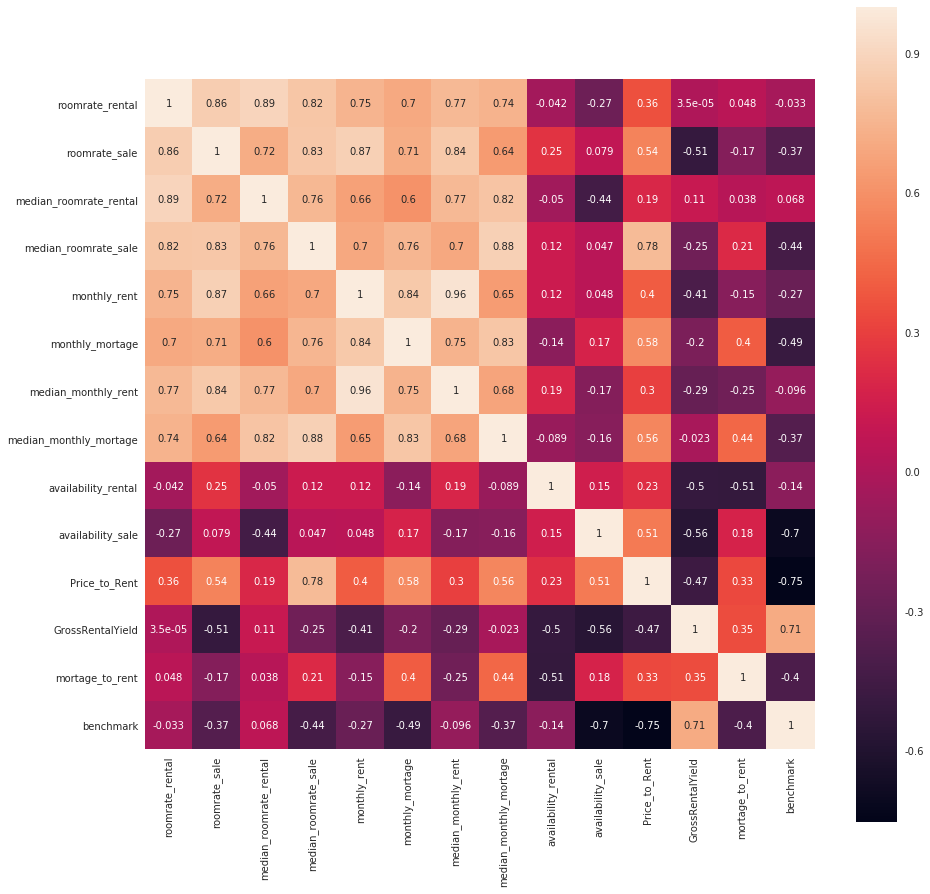

In [169]:
plt.figure(figsize=(15,15))  
# 画热力图，数值为两个变量之间的相关系数
p=sns.heatmap(Worth_to_buy10.corr(), annot=True, square=True) 

In [170]:
V2Merge.head(10)

,neighborhood,roomrate_rental,roomrate_sale,median_roomrate_rental,median_roomrate_sale,monthly_rent,monthly_mortage,median_monthly_rent,median_monthly_mortage,availability_rental,availability_sale,Price_to_Rent,GrossRentalYield,mortage_to_rent,benchmark
0,Arverne,nan,348.05,nan,309.08,2300.00,2712.69,2300.00,2452.84,0,6,nan,nan,1.18,nan
1,Astoria,2.84,653.00,2.84,832.72,2335.37,3860.35,2200.00,2618.80,184,106,24.45,0.05,1.65,0.03
2,Auburndale,4.17,496.76,4.49,501.34,1924.75,3877.84,2072.50,3647.55,1,16,9.31,0.10,2.01,0.05
3,Bath Beach,2.21,563.17,1.92,744.64,1916.46,3358.18,1725.00,2651.99,7,46,32.38,0.05,1.75,0.03
4,Battery Park City,5.98,1394.50,5.82,1182.16,5657.13,5397.71,4560.00,3651.05,32,88,16.93,0.05,0.95,0.05
5,Bay Ridge,1.83,619.47,1.87,720.49,2026.41,4401.36,1825.00,3909.95,48,116,32.08,0.04,2.17,0.02
6,Bay Terrace (Queens),2.87,273.25,2.56,310.00,2525.00,1619.33,2175.00,1234.72,3,16,10.10,0.13,0.64,0.20
7,Bayonne,1.85,445.35,1.93,488.65,1920.80,1743.33,1850.00,1642.97,126,29,21.08,0.05,0.91,0.05
8,Bayside,2.19,502.26,2.16,738.23,2114.00,3514.59,2062.50,3483.07,4,24,28.54,0.05,1.66,0.03
9,Bedford Park,nan,245.31,nan,248.59,1966.83,948.82,1675.00,730.21,0,9,nan,nan,0.48,nan


#### 3.4 Visualization using Folium
#Question6.1 - To showcase the neighborhoods based on market size from Streeteasy

In [171]:
with open('merged.geojson', 'r') as f:
    data = json.load(f)
    data = json.dumps(data)
merged_json = data

In [172]:
Rental.head()

,GeneralType,RentalType,bath,bed,fee,listing,neighborhood,price,size,Borough,MODZCTA
0,For Rental,Rental Unit,1.00,1.00,No Fee,Glenwood,Lenox Hill,3395.00,nan,Manhattan,10021
1,For Rental,House,2.00,2.00,Fee,Vue Realty Group LLC,Hoboken,4400.00,1075.00,NJ,07030
2,For Rental,Condo,1.00,1.00,Fee,Trompeter Real Estate,Historic Downtown,2450.00,807.00,NJ,07302
3,For Rental,Rental Unit,1.00,1.00,No Fee,"Rose Associates, Inc.",Turtle Bay,4292.00,749.00,Manhattan,10017
4,For Rental,House,2.00,3.00,Fee,"Garden State Realty Group, LLC",West Side,2700.00,1424.00,NJ,07304


In [173]:
Rental2 = Rental.rename(columns = {'MODZCTA':'zip_code'})
Rental2= Rental2.loc[:,["price","zip_code"]]
Rental2.head()

,price,zip_code
0,3395.00,10021
1,4400.00,07030
2,2450.00,07302
3,4292.00,10017
4,2700.00,07304


In [174]:
NYC_heat_map1 = folium.Map(location = [40.730610,-73.935242], tiles="cartodbpositron", zoom_start = 10)

folium.Choropleth(
    geo_data = merged_json,
    data = Rental2,
    columns =['zip_code','price'],
    key_on =  'feature.properties.postalCode',
    fill_color = 'Paired',
    nan_fill_color = 'grey',
).add_to(NYC_heat_map1)

NYC_heat_map1

#### 3.4 Visualization using Folium
#Question6.2 - To showcase the neighborhoods based on sales market size from Streeteasy

In [175]:
Sale2 = Sale.rename(columns = {'MODZCTA':'zip_code'})
Sale2= Sale2.loc[:,["price","zip_code"]]
Sale2.head()

,price,zip_code
16671,3280000.00,11201
16672,1800000.00,11105
16673,439000.00,11209
16674,10350000.00,10024
16675,508000.00,07849


In [527]:
NYC_heat_map2 = folium.Map(location = [40.730610,-73.935242], tiles="cartodbpositron", zoom_start = 10)

folium.Choropleth(
    geo_data = merged_json,
    data = Sale2,
    columns =['zip_code','price'],
    key_on =  'feature.properties.postalCode',
    fill_color = 'Paired',
    nan_fill_color = 'grey',
).add_to(NYC_heat_map2)

#NYC_heat_map2

#### 3.4 Visualization using Folium
#Question7.1 - To showcase the neighborhoods based on median pricing (rental) from Streeteasy

In [177]:
#Rental2.head()

In [178]:
Rental2M=Rental2.groupby("zip_code").agg({"price":"median"})
Rental2M['zip_code']=Rental2M.index
Rental2M = Rental2M.sort_values(by = ["price"],ascending = [False]).head(10)
Rental2M

,price,zip_code
zip_code,,
10282,6500.00,10282
10015,6497.50,10015
10038,5374.00,10038
10012,5095.00,10012
10010,4887.50,10010
10029,4767.00,10029
10011,4670.50,10011
10280,4560.00,10280
10018,4512.50,10018


In [528]:
NYC_rental_map = folium.Map(location = [40.730610,-73.935242], tiles="cartodbpositron", zoom_start = 10)

folium.Choropleth(
    geo_data = merged_json,
    data = Rental2M,
    columns =['zip_code','price'],
    key_on =  'feature.properties.postalCode',
    fill_color = 'Spectral',
    nan_fill_color = 'grey',
).add_to(NYC_rental_map)

#NYC_rental_map

#### 3.4 Visualization using Folium
#Question7.2 - To showcase the neighborhoods based on median pricing (sale) from Streeteasy

In [180]:
Sale2.head()

,price,zip_code
16671,3280000.00,11201
16672,1800000.00,11105
16673,439000.00,11209
16674,10350000.00,10024
16675,508000.00,07849


In [181]:
Sale2M=Sale2.groupby("zip_code").agg({"price":"median"})
Sale2M['zip_code']=Sale2M.index
Sale2M = Sale2M.sort_values(by = ["price"],ascending = [False]).head(10)
Sale2M

,price,zip_code
zip_code,,
10015,4950000.00,10015
10012,4950000.00,10012
10282,4150000.00,10282
10001,3995000.00,10001
10065,2762500.00,10065
10029,2347300.00,10029
10011,2324500.00,10011
10014,2177500.00,10014
11201,2000000.00,11201


In [529]:
NYC_sale_map = folium.Map(location = [40.730610,-73.935242], tiles="cartodbpositron", zoom_start = 10)

folium.Choropleth(
    geo_data = merged_json,
    data = Sale2M,
    columns =['zip_code','price'],
    key_on =  'feature.properties.postalCode',
    fill_color = 'Spectral',
    nan_fill_color = 'grey',
).add_to(NYC_sale_map)

#NYC_sale_map

#### 3.5 Machine Learning: Multiple Linear Regression
##### 3.5.1 merged data sets

In [239]:
df.head()

,GeneralType,RentalType,bath,bed,fee,listing,neighborhood,price,size,Borough,MODZCTA,NewType_x,BuildingType_x,NewType_y,BuildingType_y
0,For Rental,Rental Unit,1.00,1.00,No Fee,Glenwood,Lenox Hill,3395.00,nan,Manhattan,10021,Regular,Rental Building,Regular,Rental Building
1,For Rental,House,2.00,2.00,Fee,Vue Realty Group LLC,Hoboken,4400.00,1075.00,NJ,07030,Regular,House / Townhouse,Regular,House / Townhouse
2,For Rental,Condo,1.00,1.00,Fee,Trompeter Real Estate,Historic Downtown,2450.00,807.00,NJ,07302,Regular,Condo / Co-op,Regular,Condo / Co-op
3,For Rental,Rental Unit,1.00,1.00,No Fee,"Rose Associates, Inc.",Turtle Bay,4292.00,749.00,Manhattan,10017,Regular,Rental Building,Regular,Rental Building
4,For Rental,House,2.00,3.00,Fee,"Garden State Realty Group, LLC",West Side,2700.00,1424.00,NJ,07304,Regular,House / Townhouse,Regular,House / Townhouse


In [240]:
mapping2 = pd.read_excel("mapping2.xlsx")
mapping2 = pd.DataFrame(mapping2)
mapping2.head()

,RentalType,NewType,BuildingType
0,Building,Regular,Commercial Building
1,Commercial Building,Regular,Commercial Building
2,Condo,Regular,Condo / Co-op
3,Condop,Regular,Condo / Co-op
4,Co-op,Regular,Condo / Co-op


In [241]:
df = pd.merge(df,mapping2,on = "RentalType", how = "left")
df.head()

,GeneralType,RentalType,bath,bed,fee,listing,neighborhood,price,size,Borough,MODZCTA,NewType_x,BuildingType_x,NewType_y,BuildingType_y,NewType,BuildingType
0,For Rental,Rental Unit,1.00,1.00,No Fee,Glenwood,Lenox Hill,3395.00,nan,Manhattan,10021,Regular,Rental Building,Regular,Rental Building,Regular,Rental Building
1,For Rental,House,2.00,2.00,Fee,Vue Realty Group LLC,Hoboken,4400.00,1075.00,NJ,07030,Regular,House / Townhouse,Regular,House / Townhouse,Regular,House / Townhouse
2,For Rental,Condo,1.00,1.00,Fee,Trompeter Real Estate,Historic Downtown,2450.00,807.00,NJ,07302,Regular,Condo / Co-op,Regular,Condo / Co-op,Regular,Condo / Co-op
3,For Rental,Rental Unit,1.00,1.00,No Fee,"Rose Associates, Inc.",Turtle Bay,4292.00,749.00,Manhattan,10017,Regular,Rental Building,Regular,Rental Building,Regular,Rental Building
4,For Rental,House,2.00,3.00,Fee,"Garden State Realty Group, LLC",West Side,2700.00,1424.00,NJ,07304,Regular,House / Townhouse,Regular,House / Townhouse,Regular,House / Townhouse


In [242]:
data = df[['GeneralType','NewType','BuildingType','Borough','fee','bed','bath','size','price']]
data.head()

,GeneralType,NewType,BuildingType,Borough,fee,bed,bath,size,price
0,For Rental,Regular,Rental Building,Manhattan,No Fee,1.00,1.00,nan,3395.00
1,For Rental,Regular,House / Townhouse,NJ,Fee,2.00,2.00,1075.00,4400.00
2,For Rental,Regular,Condo / Co-op,NJ,Fee,1.00,1.00,807.00,2450.00
3,For Rental,Regular,Rental Building,Manhattan,No Fee,1.00,1.00,749.00,4292.00
4,For Rental,Regular,House / Townhouse,NJ,Fee,3.00,2.00,1424.00,2700.00


In [243]:
dataRental = data[data["GeneralType"]=="For Rental"]
dataSale = data[data["GeneralType"]=="For Sale"]

In [244]:
dataRental = dataRental.drop(["GeneralType"],axis=1)
dataSale = dataSale.drop(["GeneralType"],axis=1)

Descriptive Statistics

Check the descriptive statistics of the numerical columns using dataframe describe method
Output the count distribution of each categorical feature using series value_counts method

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001412AFB6278>,
      dtype=object)

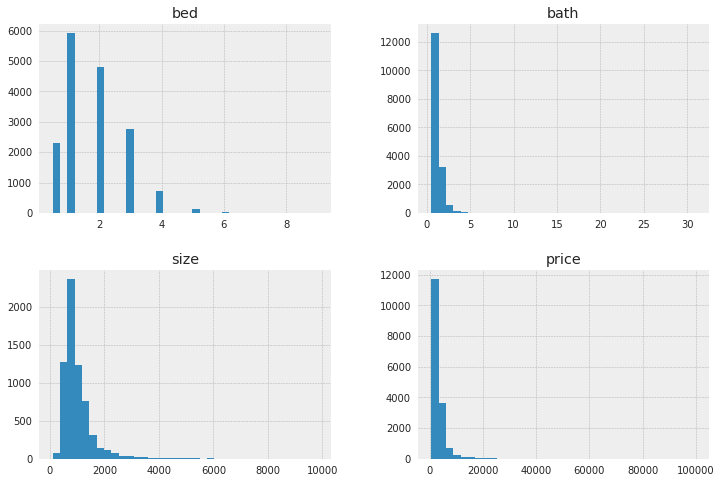

In [245]:
dataRental.hist(bins=36, figsize=(12,8))

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001412B33FA90>,
      dtype=object)

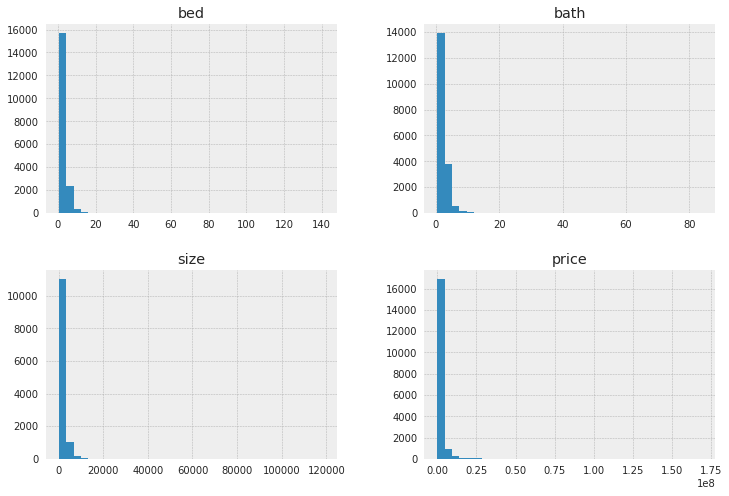

In [246]:
dataSale.hist(bins=36, figsize=(12,8))

In [247]:
dataRental.describe()

,bed,bath,size,price
count,16666.00,16666.00,6510.00,16666.00
mean,1.73,1.28,1010.00,3468.01
std,1.03,0.64,651.65,3713.04
min,0.50,0.50,100.00,550.00
25%,1.00,1.00,670.00,2000.00
50%,2.00,1.00,850.00,2595.00
75%,2.00,1.00,1149.75,3596.75
max,9.00,31.00,9819.00,100000.00


In [248]:
dataSale.describe()

,bed,bath,size,price
count,18420.00,18420.00,12281.00,18420.00
mean,2.68,2.16,1778.19,1978535.53
std,2.83,1.87,2010.85,4119868.68
min,0.50,0.50,150.00,48000.00
25%,1.00,1.00,833.00,529000.00
50%,2.00,2.00,1245.00,899000.00
75%,3.00,2.50,2142.00,1825000.00
max,141.00,84.00,118770.00,169000000.00


In [249]:
categorical = ['NewType','BuildingType','Borough','fee']

for feature in categorical:
    print(dataSale[feature].value_counts())
    print('')

Regular            17034
New Development     1386
Name: NewType, dtype: int64

Condo / Co-op          13882
Family Home             2185
House / Townhouse       2008
Commercial Building      213
Mixed-Use Building        71
Other type                37
Rental Building           24
Name: BuildingType, dtype: int64

Manhattan        7425
Brooklyn         4536
Queens           3457
NJ               1962
Bronx             721
Staten Island     319
Name: Borough, dtype: Int64

Fee    18420
Name: fee, dtype: Int64



In [250]:
categorical = ['NewType','BuildingType','Borough','fee']

for feature in categorical:
    print(dataRental[feature].value_counts())
    print('')

Regular            16049
New Development      617
Name: NewType, dtype: int64

Rental Building        11924
Condo / Co-op           2385
Family Home             1455
House / Townhouse        869
Other type                20
Commercial Building       11
Mixed-Use Building         2
Name: BuildingType, dtype: int64

Manhattan        6544
Brooklyn         4515
NJ               3006
Queens           2169
Bronx             413
Staten Island      19
Name: Borough, dtype: Int64

No Fee    10464
Fee        6202
Name: fee, dtype: Int64



Preparing the data for Multiple Linear Regression

In [251]:
# Generate the boolean flags indicating missing rows and columns
missingRows = pd.isnull(dataSale).sum(axis=1) > 0
missingCols = pd.isnull(dataSale).sum(axis=0) > 0
print('The columns with missingness are %s' %(dataSale.columns[missingCols]))
dataSale = dataSale[~missingRows]

The columns with missingness are Index(['size'], dtype='object')


In [252]:
# Generate the boolean flags indicating missing rows and columns
missingRows = pd.isnull(dataRental).sum(axis=1) > 0
missingCols = pd.isnull(dataRental).sum(axis=0) > 0
print('The columns with missingness are %s' %(dataRental.columns[missingCols]))
dataRental = dataRental[~missingRows]

The columns with missingness are Index(['size'], dtype='object')


### Modelling for Rent - dataRental
##### 3.5.2

In [253]:
dataRental = dataRental[dataRental["size"]!=None]
dataRental

,NewType,BuildingType,Borough,fee,bed,bath,size,price
1,Regular,House / Townhouse,NJ,Fee,2.00,2.00,1075.00,4400.00
2,Regular,Condo / Co-op,NJ,Fee,1.00,1.00,807.00,2450.00
3,Regular,Rental Building,Manhattan,No Fee,1.00,1.00,749.00,4292.00
4,Regular,House / Townhouse,NJ,Fee,3.00,2.00,1424.00,2700.00
13,New Development,Condo / Co-op,Manhattan,No Fee,1.00,1.50,847.00,5950.00
...,...,...,...,...,...,...,...,...
16648,Regular,Rental Building,Manhattan,No Fee,4.00,2.00,1200.00,8500.00
16653,Regular,Family Home,Brooklyn,Fee,2.00,1.00,700.00,2040.00
16654,Regular,Rental Building,Brooklyn,Fee,1.00,1.00,600.00,2750.00
16658,Regular,Condo / Co-op,Manhattan,No Fee,4.00,4.50,3042.00,27000.00


In [254]:
dataFeatures = dataRental[['Borough','BuildingType','NewType','fee','bed','bath','size']].copy()
price = dataRental['price']
dataFeatures['fee'] = dataFeatures.fee.map(lambda t:0 if t=='Fee' else 1)
dataFeatures['NewType'] = dataFeatures.fee.map(lambda t:0 if t=='Regular' else 1)
dummy= pd.get_dummies(dataFeatures.Borough, prefix='1')
dummy2= pd.get_dummies(dataFeatures.BuildingType, prefix='2')
dummy.drop('1_NJ', axis=1, inplace=True) # T 1 is the dominant category
dummy2.drop('2_Mixed-Use Building', axis=1, inplace=True) # T 1 is the dominant category
dataFeatures = dataFeatures.drop('Borough', axis=1)
dataFeatures = dataFeatures.drop('BuildingType', axis=1)
dataFeatures = pd.concat([dataFeatures, dummy,dummy2], axis=1)
dataFeatures.head()

,NewType,fee,bed,bath,size,1_Bronx,1_Brooklyn,1_Manhattan,1_Queens,1_Staten Island,2_Commercial Building,2_Condo / Co-op,2_Family Home,2_House / Townhouse,2_Rental Building
1,1,0,2.00,2.00,1075.00,0,0,0,0,0,0,0,0,1,0
2,1,0,1.00,1.00,807.00,0,0,0,0,0,0,1,0,0,0
3,1,1,1.00,1.00,749.00,0,0,1,0,0,0,0,0,0,1
4,1,0,3.00,2.00,1424.00,0,0,0,0,0,0,0,0,1,0
13,1,1,1.00,1.50,847.00,0,0,1,0,0,0,1,0,0,0


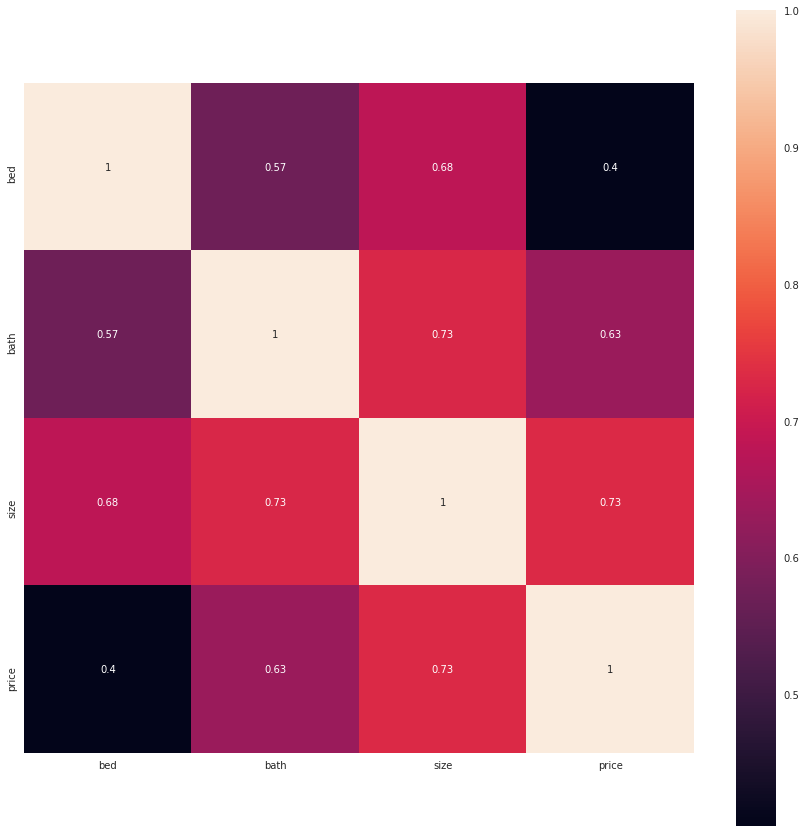

In [255]:
plt.figure(figsize=(15,15))  
# 画热力图，数值为两个变量之间的相关系数
p=sns.heatmap(dataRental.corr(), annot=True, square=True) 

Creating linear regression model and see how this model fits

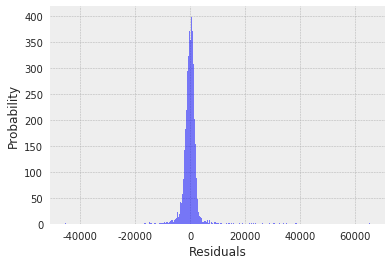

In [256]:
model = linear_model.LinearRegression()
model.fit(dataFeatures, price)
residuals = price - model.predict(dataFeatures)
plt.hist(residuals, bins=500, facecolor='blue', alpha=0.5)
plt.xlabel('Residuals') 
plt.ylabel('Probability') 
plt.show()

In [257]:
print('R^2 is equal to %.3f' %(model.score(dataFeatures, price)))
print('RSS is equal to %.3f' %(np.sum((price-model.predict(dataFeatures))**2)))

R^2 is equal to 0.647
RSS is equal to 64151359599.275


In [258]:
print('The intercept is %.3f' %(model.intercept_))

The intercept is -3517.924


In [259]:
print('The slopes are %s' %(model.coef_[0:5].tolist()))

The slopes are [0.0, 75.74345932157868, -711.5508039100135, 1257.0316252321873, 5.310588388023119]


In [260]:
#print('negative slope column names %s' %(dataFeatures.columns[lm.coef_<0]))
#print('positive slope column names %s' %(dataFeatures.columns[lm.coef_>0]))

Running a Linear Model using Log(price)

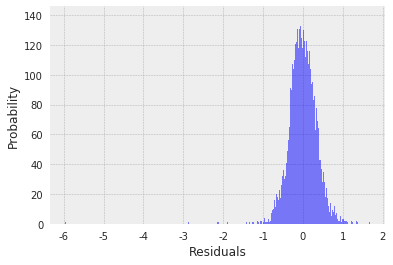

In [261]:
model.fit(dataFeatures, np.log(price))
residuals = np.log(price) - model.predict(dataFeatures)
plt.hist(residuals, bins=500, facecolor='blue', alpha=0.5)
plt.xlabel('Residuals') 
plt.ylabel('Probability') 
plt.show()

In [262]:
print('The R^2 of the new linear model is %.3f ' %(model.score(dataFeatures, np.log(price))))

The R^2 of the new linear model is 0.704 


This linear model has a much higher  R2  compared to the orginal one

In [263]:
colnames = dataFeatures.columns
result = pd.DataFrame(model.coef_).transpose()
result.columns = colnames.tolist()
result['intercept'] = model.intercept_ 
result = result.transpose()
result.columns = ['coefficient']
coeffcient = result.sort_values(by = ["coefficient"],ascending = [False]).T
coeffcient

,intercept,1_Manhattan,bath,fee,1_Brooklyn,2_Condo / Co-op,1_Queens,bed,2_Rental Building,size,NewType,1_Bronx,2_House / Townhouse,2_Family Home,1_Staten Island,2_Commercial Building
coefficient,7.00,0.54,0.20,0.18,0.14,0.14,0.11,0.03,0.02,0.00,0.00,-0.02,-0.02,-0.10,-0.17,-0.33


In [264]:
coeffcient2 = coeffcient.rename(columns = {'1_Manhattan':'Manhattan','1_Brooklyn':'Brooklyn','2_Condo / Co-op':'Condo / Co-op','1_Queens':'Queens','2_Rental Building':'Rental Building','1_Staten Island':'Staten Island','1_Bronx':'Bronx','2_House / Townhouse':'House / Townhouse','2_Family Home':'Family Home','2_Commercial Building':'Commercial Building'})
coeffcient3 = coeffcient2[['bath','bed','size','fee','NewType','Manhattan','Brooklyn','Queens','Staten Island','Bronx','Commercial Building','Rental Building','Condo / Co-op','House / Townhouse','Family Home']]
coeffcient3

,bath,bed,size,fee,NewType,Manhattan,Brooklyn,Queens,Staten Island,Bronx,Commercial Building,Rental Building,Condo / Co-op,House / Townhouse,Family Home
coefficient,0.20,0.03,0.00,0.18,0.00,0.54,0.14,0.11,-0.17,-0.02,-0.33,0.02,0.14,-0.02,-0.10


Train and test datasets

In [265]:
from sklearn.model_selection import train_test_split

In [266]:
dataFeatures_train,dataFeatures_test,price_train,price_test = train_test_split(dataFeatures,price,test_size=0.2)

In [284]:
model = linear_model.LinearRegression()
#model = LassoCV()
model.fit(dataFeatures_train, price_train)
# lasso系数
#print(model.alpha_)
# 相关系数
print(model.coef_)

[   0.          213.91676932 -405.04298816 1109.69228157    4.40483757
 -213.97278016  824.44797038 2890.26197709  732.29317203  -88.71145707
  387.35857603 1148.1151151  -305.46563681  -29.34621781  687.51799342]


In [285]:
model.score(dataFeatures_test, price_test)

0.6164380778702978

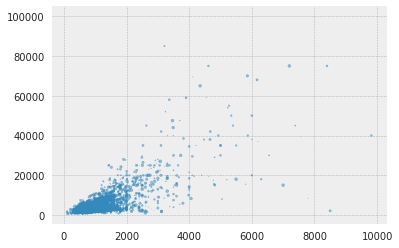

In [287]:
import numpy as np
import matplotlib.pyplot as plt

x=dataRental['size']
y=dataRental['price']
N = 5000
area = (3 * np.random.rand(N))**2
plt.scatter(x, y, s=area, alpha=0.5)

In [296]:
dataFeatures2 = dataFeatures.iloc[[666]]
dataFeatures2

,NewType,fee,bed,bath,size,1_Bronx,1_Brooklyn,1_Manhattan,1_Queens,1_Staten Island,2_Commercial Building,2_Condo / Co-op,2_Family Home,2_House / Townhouse,2_Rental Building
1893,1,1,1.00,1.00,600.00,0,0,1,0,0,0,0,0,0,1


In [297]:
model.predict(dataFeatures2)

array([3942.42835342])

In [298]:
dataRental.iloc[[666]]

,NewType,BuildingType,Borough,fee,bed,bath,size,price
1893,Regular,Rental Building,Manhattan,No Fee,1.00,1.00,600.00,3800.00


It predicted value of 3,942  which is very close to actual value of 3,800.

### Modelling for Sale - dataSale
##### 3.5.3

In [460]:
dataSale = dataSale[dataSale["size"]!=None]
dataSale

,NewType,BuildingType,Borough,fee,bed,bath,size,price
16666,New Development,Condo / Co-op,Brooklyn,Fee,1.00,2.50,3068.00,3280000.00
16667,Regular,Family Home,Queens,Fee,5.00,4.00,2048.00,1800000.00
16668,Regular,Condo / Co-op,Brooklyn,Fee,1.00,1.00,1080.00,439000.00
16669,New Development,Condo / Co-op,Manhattan,Fee,5.00,4.50,3133.00,10350000.00
16670,Regular,Condo / Co-op,NJ,Fee,3.00,2.50,1861.00,508000.00
...,...,...,...,...,...,...,...,...
35080,Regular,Condo / Co-op,Manhattan,Fee,1.00,1.00,667.00,695000.00
35082,Regular,Condo / Co-op,Manhattan,Fee,0.50,1.00,625.00,688000.00
35083,Regular,Condo / Co-op,Manhattan,Fee,3.00,3.00,3007.00,4299000.00
35084,Regular,Condo / Co-op,Brooklyn,Fee,2.00,1.50,1079.00,549000.00


In [490]:
dataFeatures = dataSale[['Borough','BuildingType','fee','bed','bath','size']].copy()
price = dataSale['price']
dataFeatures['fee'] = dataFeatures.fee.map(lambda t:0 if t=='Fee' else 1)
dataFeatures['NewType'] = dataFeatures.fee.map(lambda t:0 if t=='Regular' else 1)
dummy= pd.get_dummies(dataFeatures.Borough, prefix='1')
dummy2= pd.get_dummies(dataFeatures.BuildingType, prefix='2')
dummy.drop('1_NJ', axis=1, inplace=True) # T 1 is the dominant category
dummy2.drop('2_Mixed-Use Building', axis=1, inplace=True) # T 1 is the dominant category
dataFeatures = dataFeatures.drop('Borough', axis=1)
dataFeatures = dataFeatures.drop('BuildingType', axis=1)
dataFeatures = pd.concat([dataFeatures, dummy,dummy2], axis=1)
dataFeatures.head()

,fee,bed,bath,size,NewType,1_Bronx,1_Brooklyn,1_Manhattan,1_Queens,1_Staten Island,2_Commercial Building,2_Condo / Co-op,2_Family Home,2_House / Townhouse,2_Other type,2_Rental Building
16666,0,1.00,2.50,3068.00,1,0,1,0,0,0,0,1,0,0,0,0
16667,0,5.00,4.00,2048.00,1,0,0,0,1,0,0,0,1,0,0,0
16668,0,1.00,1.00,1080.00,1,0,1,0,0,0,0,1,0,0,0,0
16669,0,5.00,4.50,3133.00,1,0,0,1,0,0,0,1,0,0,0,0
16670,0,3.00,2.50,1861.00,1,0,0,0,0,0,0,1,0,0,0,0


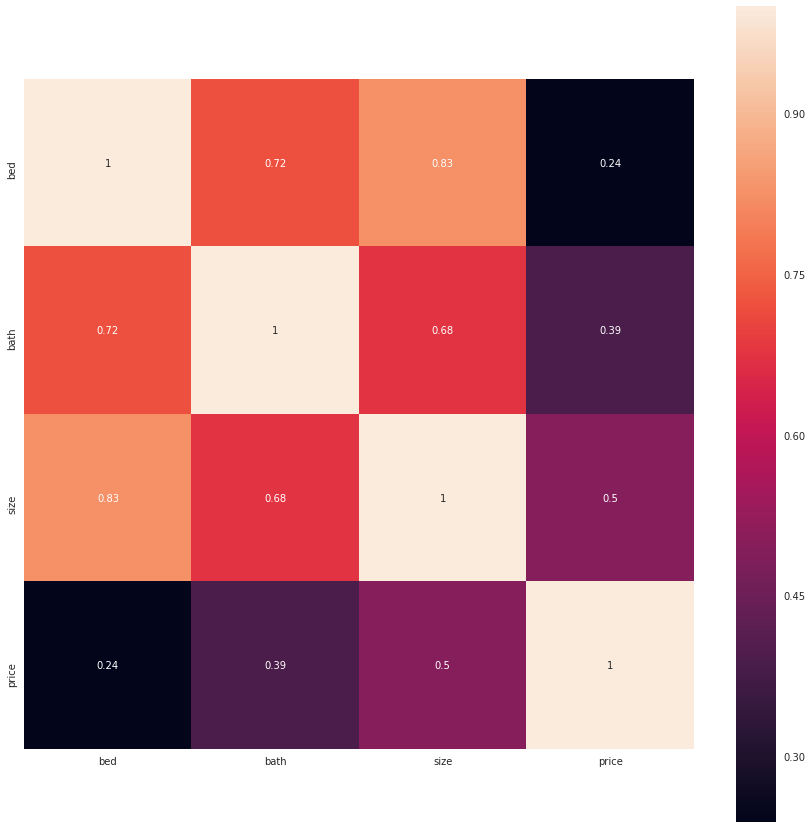

In [491]:
plt.figure(figsize=(15,15))  
# 画热力图，数值为两个变量之间的相关系数
p=sns.heatmap(dataSale.corr(), annot=True, square=True) 

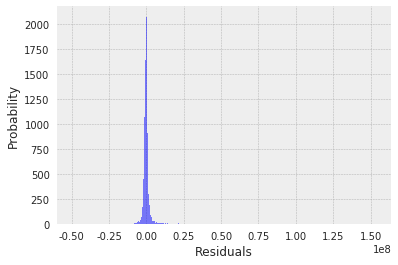

In [492]:
model = linear_model.LinearRegression()
model.fit(dataFeatures, price)
residuals = price - model.predict(dataFeatures)
plt.hist(residuals, bins=500, facecolor='blue', alpha=0.5)
plt.xlabel('Residuals') 
plt.ylabel('Probability') 
plt.show()

In [493]:
print('R^2 is equal to %.3f' %(model.score(dataFeatures, price)))
print('RSS is equal to %.3f' %(np.sum((price-model.predict(dataFeatures))**2)))

R^2 is equal to 0.422
RSS is equal to 141061670261598272.000


In [494]:
print('The intercept is %.3f' %(model.intercept_))

The intercept is -1485765.044


In [495]:
print('The slopes are %s' %(model.coef_[0:5].tolist()))

The slopes are [0.0, -830900.4173040407, 613307.9209680532, 1739.9669645802846, 9.313225746154785e-10]


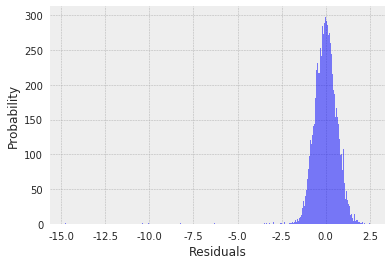

In [496]:
model.fit(dataFeatures, np.log(price))
residuals = np.log(price) - model.predict(dataFeatures)
plt.hist(residuals, bins=500, facecolor='blue', alpha=0.5)
plt.xlabel('Residuals') 
plt.ylabel('Probability') 
plt.show()

In [497]:
print('The R^2 of the new linear model is %.3f ' %(model.score(dataFeatures, np.log(price))))

The R^2 of the new linear model is 0.592 


This linear model has a much higher  R2  compared to the orginal one

In [498]:
colnames = dataFeatures.columns
result = pd.DataFrame(model.coef_).transpose()
result.columns = colnames.tolist()
result['intercept'] = model.intercept_ 
result = result.transpose()
result.columns = ['coefficient']
coeffcient = result.sort_values(by = ["coefficient"],ascending = [False]).T
coeffcient

,intercept,1_Manhattan,1_Brooklyn,bath,1_Queens,size,fee,NewType,bed,1_Staten Island,2_Family Home,1_Bronx,2_House / Townhouse,2_Condo / Co-op,2_Commercial Building,2_Rental Building,2_Other type
coefficient,13.33,1.17,0.38,0.18,0.18,0.00,0.00,-0.00,-0.10,-0.13,-0.18,-0.27,-0.28,-0.53,-0.60,-0.67,-0.73


In [499]:
coeffcient2 = coeffcient.rename(columns = {'1_Manhattan':'Manhattan','1_Brooklyn':'Brooklyn','2_Condo / Co-op':'Condo / Co-op','1_Queens':'Queens','2_Rental Building':'Rental Building','1_Staten Island':'Staten Island','1_Bronx':'Bronx','2_House / Townhouse':'House / Townhouse','2_Family Home':'Family Home','2_Commercial Building':'Commercial Building'})
coeffcient3 = coeffcient2[['bath','bed','size','Manhattan','Brooklyn','Queens','Staten Island','Bronx','Commercial Building','Rental Building','Condo / Co-op','House / Townhouse','Family Home']]
coeffcient3

,bath,bed,size,Manhattan,Brooklyn,Queens,Staten Island,Bronx,Commercial Building,Rental Building,Condo / Co-op,House / Townhouse,Family Home
coefficient,0.18,-0.10,0.00,1.17,0.38,0.18,-0.13,-0.27,-0.60,-0.67,-0.53,-0.28,-0.18


In [500]:
from sklearn.model_selection import train_test_split

In [501]:
dataFeatures_train,dataFeatures_test,price_train,price_test = train_test_split(dataFeatures,price,test_size=0.2)

In [502]:
model = linear_model.LinearRegression()
#model = LassoCV()
model.fit(dataFeatures_train, price_train)
# lasso系数
#print(model.alpha_)
# 相关系数
print(model.coef_)

[ 0.00000000e+00 -7.95912405e+05  6.01408364e+05  1.66223139e+03
  2.32830644e-10 -4.07880144e+04  5.99297883e+05  2.18765441e+06
  2.97840493e+05 -5.56731380e+04 -1.45323887e+06  7.25723460e+05
  4.26230451e+05  2.60756212e+05  2.03623752e+05  6.12355159e+05]


In [503]:
model.score(dataFeatures_test, price_test)

0.5150203626176113

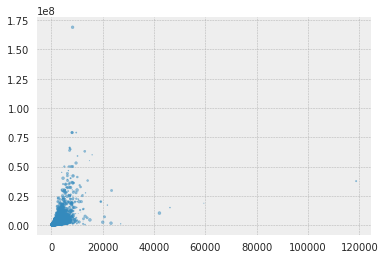

In [504]:
import numpy as np
import matplotlib.pyplot as plt

x=dataSale['size']
y=dataSale['price']
N = 5000
area = (3 * np.random.rand(N))**2
plt.scatter(x, y, s=area, alpha=0.5)

In [523]:
dataFeatures2 = dataFeatures.iloc[[888]]
dataFeatures2

,fee,bed,bath,size,NewType,1_Bronx,1_Brooklyn,1_Manhattan,1_Queens,1_Staten Island,2_Commercial Building,2_Condo / Co-op,2_Family Home,2_House / Townhouse,2_Other type,2_Rental Building
18014,0,2.00,2.00,1549.00,1,0,0,1,0,0,0,1,0,0,0,0


In [524]:
model.predict(dataFeatures2)

array([3533053.70039118])

In [525]:
dataSale.iloc[[888]]

,NewType,BuildingType,Borough,fee,bed,bath,size,price
18014,Regular,Condo / Co-op,Manhattan,Fee,2.00,2.00,1549.00,3795000.00


It predicted value of 3533053 which is far away from actual value of 3795000.

### Conclusion - So the linear regression model for rent is more fit than for sale.